In [ ]:
from notebooks.talk_ggas_mb_20191115.shared import *

In [ ]:
# HACK To manually crop spectro img widths (doesn't change audio)
spectro_img_width_px = 324  # Measured in a browser

In [ ]:
# NOTE The html <title> is set above in metadata.title

# That's not how that bird is supposed to sound!

Exploring variation in sound using spectrograms of xeno-canto data

- Dan Brown
- GGAS Master Birder Student Salon
- 2019-11-15

http://jdanbrown.org/talks/ggas-mb

# How does bird sound vary?
- Function (courtship, territory, contact, alarm, ...)
- Season (e.g. breeding)
- Time of day (e.g. dawn)
- Gender
- Age (learning)
- Geography (subspecies)
- Individual variation (within species)
- Individual repertoire (within individual)
- ...

# How to read a spectrogram
- Light to dark — loudness
- Left to right — time
- Low to high — pitch

(52613, 71)

(8, 71)


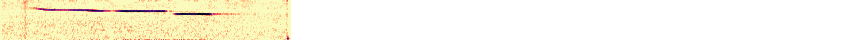
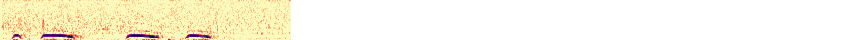
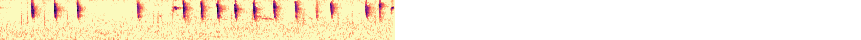
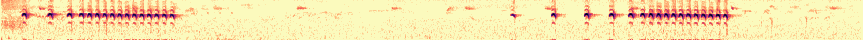
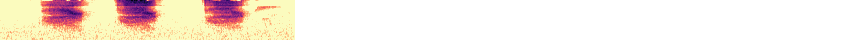
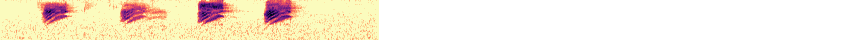
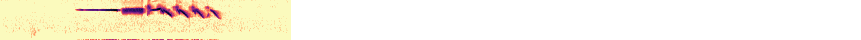
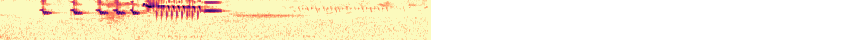

In [ ]:
_spectro_scale = 5
_selected_recs = {
    243973: ('GCSP', 'high-pitched whistles, descending in pitch'),
    172196: ('GHOW', 'low-pitched hoots'),
    154721: ('FOSP', 'short chips, variable tempo'),
    408021: ('WREN', 'short "chirps", increasing tempo'),
    252944: ('STJA', 'harsh calls'),
    110976: ('CASJ', 'harsh calls, upward pitch'),
    188039: ('WCSP', 'whistle → burry → downslurs'),
    174545: ('SOSP', '"tink" notes → fast trill → burry whistle'),
}
(search_recs
    .pipe(df_inspect, lambda df: (df.shape,))
    # Filter
    [lambda df: reduce(lambda x, y: x | y, [
        *[
            (df.species == species) & (df.xc_id == xc_id)
            for xc_id, (species, _) in _selected_recs.items()
        ],
        # df.species == 'WREN',  # XXX For explore
    ])]
    .pipe(df_inspect, lambda df: (df.shape,))
    # Sort
    # .sample(frac=1, random_state=0)  # XXX For explore
    .assign(_sortby=lambda df: df.xc_id.pipe(lambda s: as_ordered_cat(s, _selected_recs.keys())))
    .sort_values('_sortby')
    # .sort_values('xc_id')  # XXX For explore
    # View
    .assign(_talk_notes=lambda df: df.xc_id.map(lambda xc_id: '' if xc_id not in _selected_recs else _selected_recs[xc_id][-1]))
    .pipe(talk_recs_show,
        scale=_spectro_scale,
        append=['_talk_notes'],
    )
    [:100]
    [[
        # 'xc_id', 'species',  # XXX For explore
        'species_com_name',
        '_talk_notes',
        'spectro_disp',
    ]]

    # The normal, simple thing
    # .pipe(talk_hide_index_and_columns)

    # HACK Un-kill td padding for not spectros
    # HACK Crop spectro img widths (doesn't change audio)
    .pipe(lambda df: display_with_style(
        talk_hide_index_and_columns(df),
        style_css=lambda scoped_class: f'''
            /* HACK Un-kill td padding for not spectros */
            .{scoped_class} .dataframe tbody tr td:nth-child(2),
            .{scoped_class} .dataframe tbody tr td:nth-child(3) {{
                padding: 0.2em 0.5em 0.2em 0.5em !important;
            }}
            /* HACK Crop spectro img widths (doesn't change audio) */
            .{scoped_class} .bubo-audio-container {{
                width: {5/10 * _spectro_scale * spectro_img_width_px}px;
                overflow: hidden;
            }}
        ''',
    ))

)

# Hutton's Vireo notes (individuals/repertoire)
- Same single note every ~1s, for minutes at a time
- But each vocalization produces a new note!
- Randomly select within species → easy to see pattern!

(52613, 71)

(179, 71)


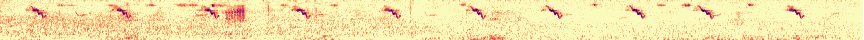
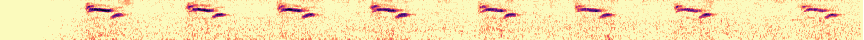
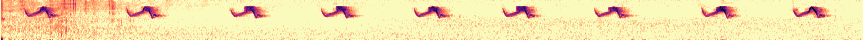
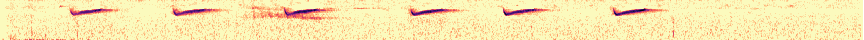
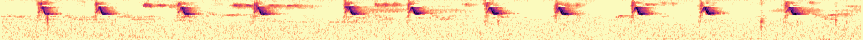
...
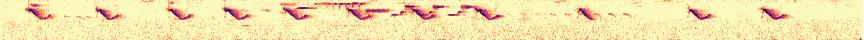
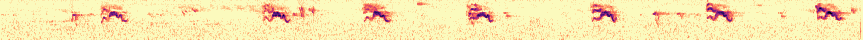
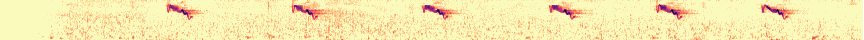
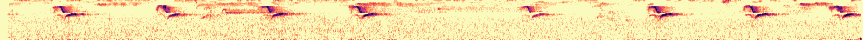
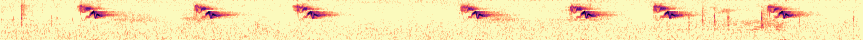

In [ ]:
_spectro_scale = 5
(search_recs
    .pipe(df_inspect, lambda df: (df.shape,))
    # Filter
    [lambda df: reduce(lambda x, y: x & y, [
        df.species == 'HUVI',
    ])]
    .pipe(df_inspect, lambda df: (df.shape,))
    # Sort
    .sample(frac=1, random_state=2)
    # View
    .pipe(talk_recs_show,
        scale=_spectro_scale,
    )
    [:25]
    [['spectro_disp']]
    .pipe(talk_hide_index_and_columns)
)

In [ ]:
talk_show_refs('''
https://www.xeno-canto.org/species/Vireo-huttoni
https://academy.allaboutbirds.org/peterson-field-guide-to-bird-sounds/?speciesCode=hutvir
https://birdsna.org/Species-Account/bna/species/hutvir/sounds
''')

# Wilson's Warbler song vs. calls (season)
- Sep–Feb: fall migration and winter
- Mar–Aug: spring migration and breeding
- Randomly select within month ranges → easy to see song vs. calls!

(52613, 71)

(204, 71)

(180, 2)

(25, 2)


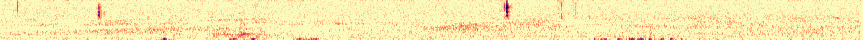
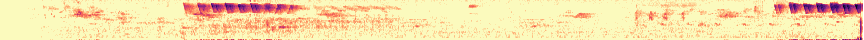
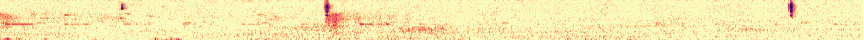
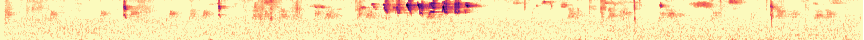
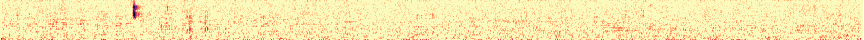
...
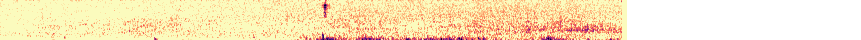
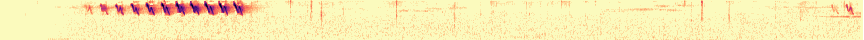
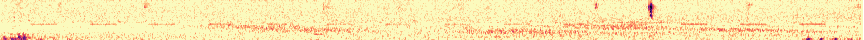
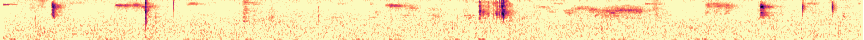
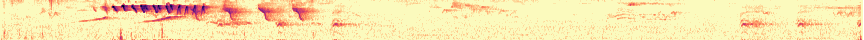

In [ ]:
_spectro_scale = 4
(talk_recs_show_seasonal(
    'WIWA',
    scale=_spectro_scale,
)
    .rename(columns={
        'fall migration / winter':     'Sep–Feb → calls',
        'spring migration / breeding': 'Mar–Aug → song',
    })

    # The normal, simple thing
    # .pipe(talk_hide_index)

    # HACK Crop spectro img widths (doesn't change audio)
    .pipe(lambda df: display_with_style(
        talk_hide_index(df),
        style_css=lambda scoped_class: f'''
            /* HACK Crop spectro img widths (doesn't change audio) */
            .{scoped_class} .bubo-audio-container {{
                width: {6/10 * _spectro_scale * spectro_img_width_px}px;
                overflow: hidden;
            }}
        ''',
    ))

)

In [ ]:
talk_show_refs('''
https://www.xeno-canto.org/species/Cardellina-pusilla
https://academy.allaboutbirds.org/peterson-field-guide-to-bird-sounds/?speciesCode=wlswar
https://birdsna.org/Species-Account/bna/species/wlswar/sounds
''')

# Spotted Towhee song (geography)
- West coast: fast or slow trill with no intro notes
- Interior: intro notes, then slow trill
- Randomly select within west coast vs. interior → easy to see difference!

(52613, 71)

(432, 71)

(432, 71)

(230, 2)

(25, 2)


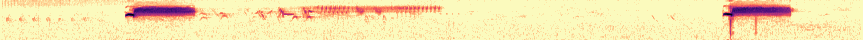
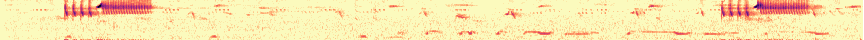
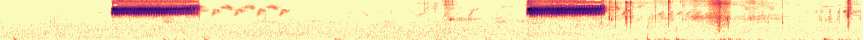
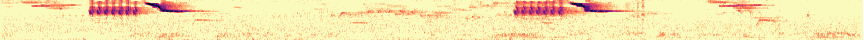
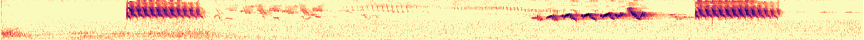
...
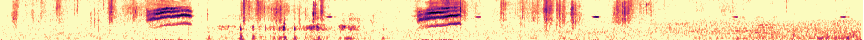
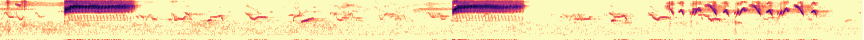
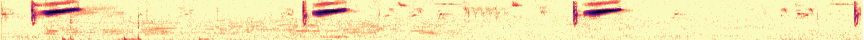
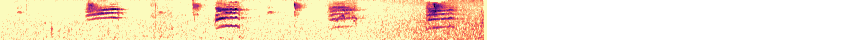
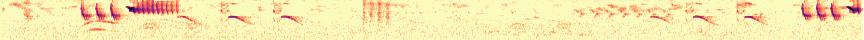

In [ ]:
_spectro_scale = 4
(search_recs
    .pipe(df_inspect, lambda df: (df.shape,))
    # Filter
    [lambda df: reduce(lambda x, y: x & y, [
        df.species == 'SPTO',
        # df.type.str.lower().str.match(r'.*song.*'),
        # df.type.str.lower().str.match(r'^song$'),
        df.quality.isin(['A', 'B']),
    ])]
    .pipe(df_inspect, lambda df: (df.shape,))
    # Sort
    # .sample(250, random_state=0)
    # .sample(50, random_state=0)
    # .sort_values(['subspecies', 'lat'], ascending=False)
    # .sort_values(['lat'], ascending=False)
    # .sort_values(['lng'], ascending=True)
    .pipe(df_inspect, lambda df: (df.shape,))
    # View
    .pipe(talk_recs_show,
        scale=_spectro_scale,
    )

    # Bin by geo (2 bins)
    #   - Very rough, but decent results
    .assign(geo=lambda df: df.pipe(df_map_rows, lambda row: (
        'West coast (W of -117°)' if row.lng < -117 else  # -117 to exclude Inyo County (Death Valley) which behaves ~like interior
        'Interior (E of -110°)'   if row.lng > -110 else  # -110 to include CO/AZ/MX (at least)
        None                                          # Throw out everything in the middle, to simplify analysis
    )))
    [lambda df: df.geo.notnull()]
    .assign(geo=lambda df: df.geo.pipe(lambda s: s.pipe(as_ordered_cat, [
        'West coast (W of -117°)',
        'Interior (E of -110°)',
    ])))
    # .pipe(df_inspect, lambda df: df[:250])  # Debug

    # Pivot by geo (manually)
    .pipe(lambda df: pd.concat(axis=1, objs=[
        (df
            [df.geo == geo]
            [['spectro_disp']]
            .rename(columns={'spectro_disp': geo})
            .sample(frac=1, random_state=0)  # Randomize per column (to avoid weird biases from incidental sorting above)
            .reset_index(drop=True)
        )
        for geo in df.geo.sort_values().unique()
    ]))
    .fillna('')
    .pipe(df_inspect, lambda df: (df.shape,))
    [:25]
    .pipe(df_inspect, lambda df: (df.shape,))

    # The normal, simple thing
    # .pipe(talk_hide_index)

    # HACK Crop spectro img widths (doesn't change audio)
    .pipe(lambda df: display_with_style(
        talk_hide_index(df),
        style_css=lambda scoped_class: f'''
            /* HACK Crop spectro img widths (doesn't change audio) */
            .{scoped_class} .bubo-audio-container {{
                width: {6/10 * _spectro_scale * spectro_img_width_px}px;
                overflow: hidden;
            }}
        ''',
    ))

)

In [ ]:
talk_show_refs('''
https://www.xeno-canto.org/species/Pipilo-maculatus
https://academy.allaboutbirds.org/peterson-field-guide-to-bird-sounds/?speciesCode=spotow
https://birdsna.org/Species-Account/bna/species/spotow/sounds
''')

# Sorting out confusing species
- Hand-picked examples that sound confusingly similar
- All the damn "wraa" calls

(52613, 71)

(13, 71)


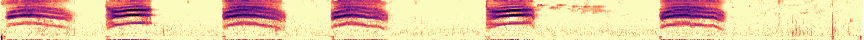
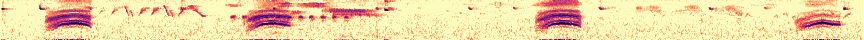
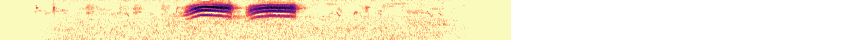
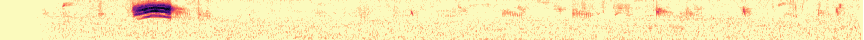
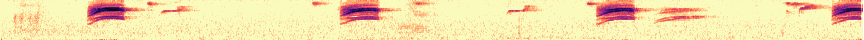
...
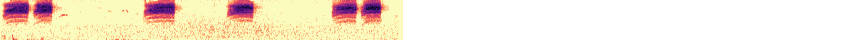
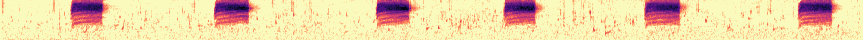
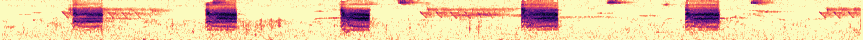
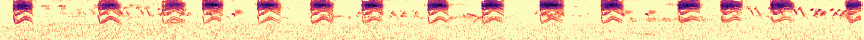
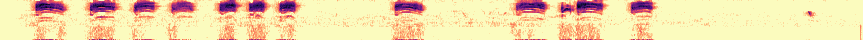

In [ ]:
# All the damn wraa calls
_spectro_scale = 4
_cmap_name = (
    'Pastel1'
    # 'Pastel2'
    # 'Set3'
)
_selected_recs = {
    14843:  ('SPTO', '"wraa"'),
    127012: ('SPTO', '"wraa"'),
    297120: ('HUVI', '"wraa"'),
    297119: ('HUVI', '"wraa"'),
    # 348986: ('HUVI', '"wraa"'),
    268597: ('HETH', 'hoarse wheeze'),
    13677:  ('HETH', 'hoarse wheeze'),
    # 131636: ('HETH', 'hoarse wheeze'),
    159366: ('WAVI', '"wraa"'),
    381527: ('WAVI', '"wraa"'),
    141349: ('BEWR', 'harsh buzz'),
    163209: ('BEWR', 'harsh buzz'),
    265810: ('HOWR', 'another harsh buzz'),
    376229: ('BGGN', 'polyphonic wheeze'),
    81059:  ('BGGN', 'polyphonic wheeze'),
}
_colors = [mpl.colors.rgb2hex(x) for x in getattr(mpl.cm, _cmap_name).colors]
(search_recs
    .pipe(df_inspect, lambda df: (df.shape,))
    # Filter
    [lambda df: reduce(lambda x, y: x | y, [
        *[
            (df.species == species) & (df.xc_id == xc_id)
            for xc_id, (species, _) in _selected_recs.items()
        ],
        # df.species == 'HUVI',  # XXX For explore
    ])]
    .pipe(df_inspect, lambda df: (df.shape,))
    # Sort
    .assign(_sortby=lambda df: df.xc_id.pipe(lambda s: as_ordered_cat(s, _selected_recs.keys())))
    .sort_values('_sortby')
    # .sort_values('xc_id')  # XXX For explore
    # .sample(frac=1, random_state=0)  # XXX For explore

    # View
    .assign(_talk_notes=lambda df: df.xc_id.map(lambda xc_id: '' if xc_id not in _selected_recs else _selected_recs[xc_id][-1]))
    .pipe(talk_recs_show,
        scale=_spectro_scale,
        append=['_talk_notes'],
    )
    [:100]
    [[
        # 'xc_id', 'species',  # XXX For explore
        'species_com_name',
        '_talk_notes',
        'spectro_disp',
    ]]

    # The normal, simple thing
    # .pipe(talk_hide_index_and_columns)

    # HACK Un-kill td padding for not spectros
    # HACK Color rows by species
    .assign(_color=lambda df: df.species_com_name.pipe(lambda s: (
        s.map({x: _colors[i] for i, x in enumerate(unique_everseen(s.tolist()))}.__getitem__)
    )))
    .pipe(lambda df: display_with_style(
        talk_hide_index_and_columns(df
            .drop(columns=['_color'])
        ),
        style_css=lambda scoped_class: '\n'.join([
            # HACK Restrict background to first two cols (after index col)
            f'''
                .{scoped_class} tbody tr:nth-child({i + 1}) td:nth-child(2),
                .{scoped_class} tbody tr:nth-child({i + 1}) td:nth-child(3) {{
                    padding: 0.2em 0.5em 0.2em 0.5em !important; /* HACK Un-kill td padding for not spectros */
                    background: {_color} !important; /* HACK Color rows by species *//
                }}
            '''
            for i, _color in enumerate(df._color.tolist())
        ]),
    ))

)

# Thanks!
- Questions?